---
---
<center> <font color=#205982 size=8 face="black body"> Natural Language Processing (NLP) Analysis  </font> <center> 
    
---
---

 
# NLP Discipline
<font color=#205982 size=5 face="black body"> PUC-Rio - B.I. Master - Turma 2020.2 </font>

#### Marcos Alonso Guimarães

> [My LinkedIn](https://www.linkedin.com/in/marcosalonso16/) 
<br>
> [My Github](https://github.com/alonsoguimaraesmarcos) 




<center> <font color='black' size=5 face="black body"> Database  </font> <center> 


The database used in this analysis were extracted from **PROCON** (Programa de Proteção e Defesa do Consumidor) related to consumer complaints about a range of companies in 2017. This project is part of *BI* discipline grade. 

<center> <font color='black' size=5 face="black body"> Script objective  </font> <center> 

This is a script for  NLP analysis from a database of companies complaints. To reach that goal, Data Analysis and NLP techniques were applied to investigate and obtain some insights about these complaints. Applying NLP techniques involves some steps, such as: 

* Tokenization
* Word Cloud
* Stopwords 
* Steamming 



## 1. Installing required packages


In [ ]:
#pip install missingno
#pip install wordcloud -q

#### 1.1 Loading libraries

In [2]:
import pandas as pd #working with dataframes
import numpy as np #for math functions to arrays and matrices
import matplotlib # used for plots
import matplotlib.pyplot as plt
import missingno as msno # for checking missing values
import nltk # - used for NLP
nltk.download('punkt')
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
nltk.download("stopwords")
from PIL import Image #for masks in word cloud
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator #word cloud
import seaborn as sns # to plot...
import re #used to remove numbers and lower the words
import string # used for remove punctuation
from collections import Counter # counts words
from nltk.stem import SnowballStemmer # for steaming
from nltk.tokenize.treebank import TreebankWordDetokenizer #detokenize...
from sklearn.feature_extraction.text import TfidfVectorizer #TF-IDF
from sklearn.feature_extraction.text import CountVectorizer # making bag of words -- CountVectorizer - number of ocurrencies for each word (Bag of words)

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\marco\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\marco\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


## 2. Database - Loading and Data Analysis 

#### 2.1 Loading database named 'base_reclamações' and showing first five rows.

In [3]:
data = pd.read_table ('base_reclamacoes.csv', engine = 'python', encoding = 'windows-1252', sep = ';') # reading and loading 
data.head() # first five rows
# if you have any problem reading the file (like "expected x fields in line y, saw w", try to rename and download it again.

,Regiao,estado,empresa,subsidiaria,area,serviço,problema,faixa etarea
0,Sudeste,SP,ITAÚ UNIBANCO S/A,BANCO ITAÚ/BANCO UNIBANCO,"BANCOS MÚLTIPLOS, COM CARTEIRA COMERCIAL",Outros Contratos,"Contrato (não cumprimento, alteração, transfer...",entre 31 a 40 anos
1,Sudeste,SP,CLARO S/A,NET,NaN,Telefonia Fixa ( Plano de Expansão / Compra e ...,Contrato - Rescisão/alteração unilateral,mais de 70 anos
2,Sudeste,SP,ELETROPAULO METROPOLITANA ELETRICIDADE DE S PAULO,ELETROPAULO METROPOLITANA,DISTRIBUIÇÃO DE ENERGIA ELÉTRICA,Energia Elétrica,PID - Pedido de Indenização por Danos Morais,entre 31 a 40 anos
3,Sudeste,SP,GNN GARAGENS LTDA - EPP,NETPARK.COM.BR,ESTACIONAMENTO DE VEÍCULOS,"Estacionamento ( Particular, Supermercado, Sho...","Vicio de qualidade (mal executado, inadequado,...",entre 31 a 40 anos
4,Sudeste,SP,CLARO S/A,CLARO / NET / EMBRATEL / CLAROTV,TELEFONIA MÓVEL CELULAR,Telefonia Fixa ( Plano de Expansão / Compra e ...,"Vicio de qualidade (mal executado, inadequado,...",entre 41 a 50 anos


In [4]:
data.iloc[1:,0] # location/position

1        Sudeste
2        Sudeste
3        Sudeste
4        Sudeste
5        Sudeste
          ...   
42302    Sudeste
42303    Sudeste
42304    Sudeste
42305    Sudeste
42306    Sudeste
Name: Regiao , Length: 42306, dtype: object

In [5]:
data.loc[0,'empresa'] # location/position

'ITAÚ UNIBANCO S/A'

After displaying the name of columns, it's possible to see that the columns 'Regiao ', 'subsidiaria ' and 'area ' have blank spaces. This could be a problem when trying to call these attributes later.

In [6]:
data.columns # - number and name of columns

Index(['Regiao ', 'estado', 'empresa', 'subsidiaria  ', 'area ', 'serviço',
       'problema', 'faixa etarea'],
      dtype='object')

Rename colums with blank spaces and 'faixa etarea'

In [7]:
data.rename(columns={'Regiao ': 'Regiao', 'subsidiaria  ': 'subsidiaria', 'area ':'area', 'faixa etarea':'faixa_etaria'}, inplace=True)
data.columns

Index(['Regiao', 'estado', 'empresa', 'subsidiaria', 'area', 'serviço',
       'problema', 'faixa_etaria'],
      dtype='object')

Just cheking shape of database.

In [8]:
#len(data) # number of rows
data.shape

(42307, 8)

#### 2.2 Checking for missing values.

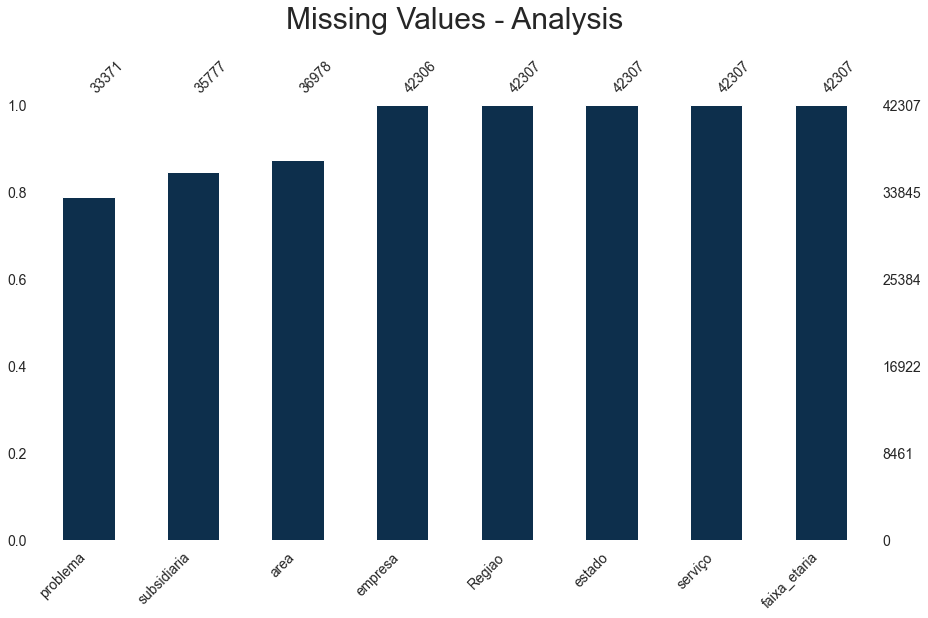

In [103]:
#msno.matrix(data) - matrix
#msno.heatmap(data) - heatmap
#msno.bar(data)# - bar plot
msno.bar(data, color="#0D2F4C", sort="ascending", figsize=(15,8), fontsize=14)
plt.title('Missing Values - Analysis', size = 30, pad=30)
plt.show() # - show plot/remove obs after running the plot

In [10]:
null_columns = data.columns[data.isnull().any()] # Defining columns with missing values
null_columns


Index(['empresa', 'subsidiaria', 'area', 'problema'], dtype='object')

In [11]:
data[null_columns].isnull().sum() # Counting number of rows.

empresa           1
subsidiaria    6530
area           5329
problema       8936
dtype: int64

In [12]:
data[pd.isnull(data['empresa'])] # Display only row with missing value in company column

,Regiao,estado,empresa,subsidiaria,area,serviço,problema,faixa_etaria
966,Nordeste,RN,NaN,NaN,NaN,Motos,NaN,entre 21 a 30 anos


#### 2.3 - Number of Complains by...

> <font color= '#125031' size=5 face="black body"> Region </font>

Central-West Region has the most complaints.

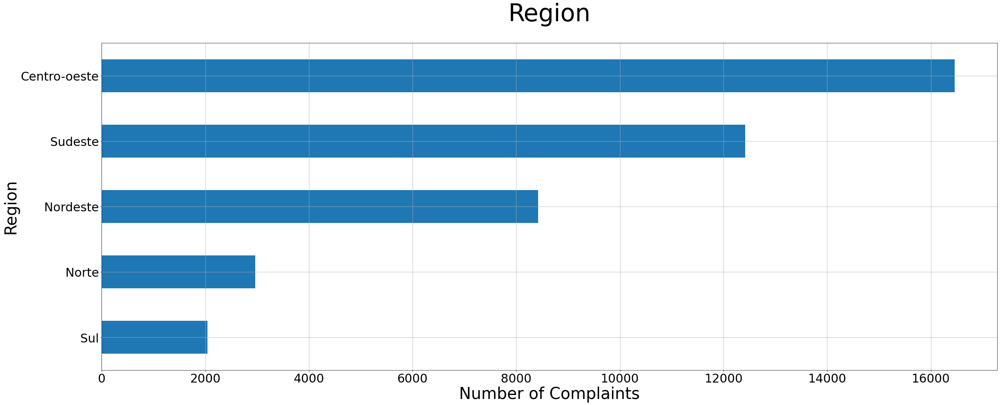

In [13]:
#df = data.sort_values('Regiao ', ascending=False)
#data['Regiao'].value_counts().plot(kind='barh')
fig, ax = plt.subplots(figsize=(40,15))
plt.xticks(fontsize= 30)
plt.yticks(fontsize= 30)
data_sorted = data['Regiao'].value_counts().sort_values()
#plt.figure(figsize=(40,15)) 
data_sorted.plot(kind='barh')
plt.xlabel('Number of Complaints', size = 40)
plt.ylabel('Region', size = 40)
plt.title('Region', size = 60, pad=55)
#plt.text(18000, .025, 'The major of complaints in database is from Central-West Region')
plt.grid()
plt.show()

> <font color = '#125031' size = 5 face= "black body"> State </font>

Although Central-West has the major of complaints, São Paulo-SP (located in Southeast) is the first state with the most number of complaints.

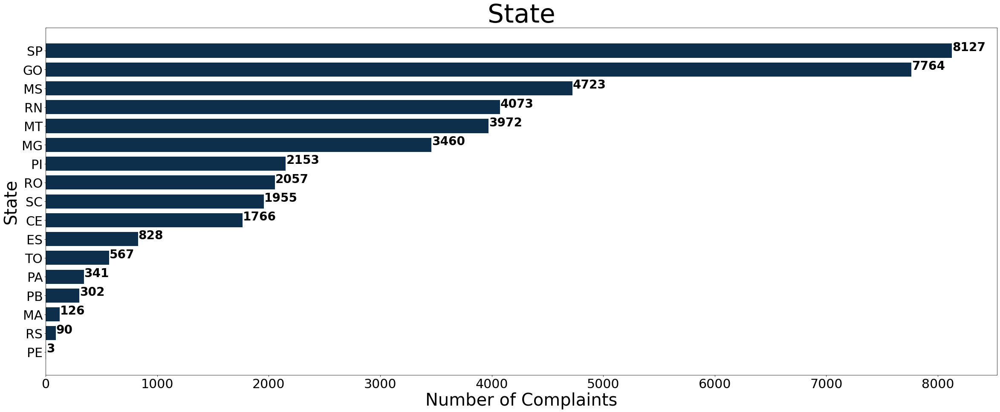

In [14]:
df = data.groupby(['estado']).count().sort_values('empresa')
x = df.index
y = df.Regiao # complete column
#y = data.Regiao.value_counts()
fig, ax = plt.subplots(figsize=(40,15))
plt.xticks(fontsize= 30)
plt.yticks(fontsize= 30)
width = 0.75 # the width of the bars 
ind = np.arange(len(y))  # the x locations for the groups
ax.barh(ind, y, width, color="#0D2F4C")
ax.set_yticks(ind)
ax.set_yticklabels(x, minor=False)
plt.title('State', size = 60)
plt.xlabel('Number of Complaints', size = 40)
plt.ylabel('State', size = 40)
for i, v in enumerate(y):
    ax.text(v + 3, i, str(v), color='black', fontweight='bold', size = 28)

In [15]:
type(df) # just checking type of 'df' to confirm it is a dataframe

pandas.core.frame.DataFrame

In [16]:
df1 = data.groupby(['Regiao']).count().sort_values('empresa')
df1
#df1.add_suffix('_Count').reset_index()

,estado,empresa,subsidiaria,area,serviço,problema,faixa_etaria
Regiao,,,,,,,
Sul,2045,2045,1533,1772,2045,1525,2045
Norte,2965,2965,2539,2336,2965,2628,2965
Nordeste,8423,8422,6982,7180,8423,6905,8423
Sudeste,12415,12415,10361,10913,12415,10303,12415
Centro-oeste,16459,16459,14362,14777,16459,12010,16459


In [17]:
pd.DataFrame({'count' : data.groupby( [ "Regiao"] ).size()}).reset_index()

,Regiao,count
0,Centro-oeste,16459
1,Nordeste,8423
2,Norte,2965
3,Sudeste,12415
4,Sul,2045


> <font color = '#125031' size = 5 face = "black body"> Company </font>

<font color = 'red' size = 6 face = "black body"> Warning!! </font>

Despite the fact that a plot visualisation it is necessary and important, this step at this momment will not give a reliable insight about the distribution of companies. We have to do a few number of steps first. This is an important process because the longer is the string the higher the possiblity that two or more strings refer to only one company. For example, TIM CELULAR S.A. = TIM CELULAR S/A (both on database).

That will be seen on section 3.

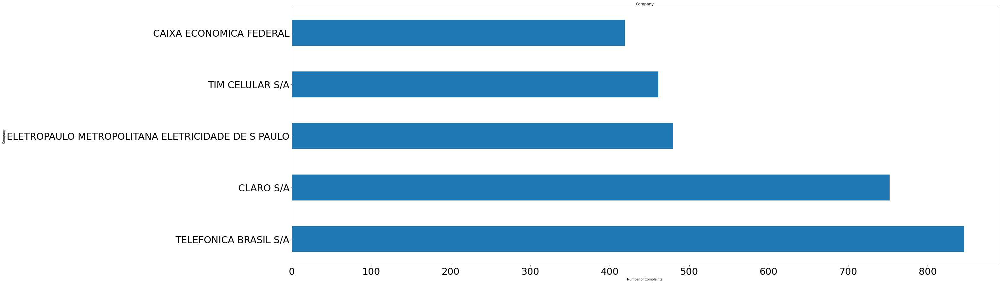

In [18]:
fig, ax = plt.subplots(figsize=(40,15))
plt.xticks(fontsize= 30)
plt.yticks(fontsize= 30)
data.groupby('empresa').size().sort_values(ascending=False)[:5].plot(kind='barh')
#data['empresa'].value_counts()[:5].plot(kind='barh')
plt.xlabel('Number of Complaints')
plt.ylabel('Company')
plt.title('Company')
plt.show()

> <font color = '#125031' size = 5 face = "black body"> Age Group </font>

There are approximately 8% of age non-informed. Besides, 22% of complaints belongs to age group between 31-40 years.

In [19]:
data.faixa_etaria.value_counts(normalize=True)

entre 31 a 40 anos    0.221524
entre 41 a 50 anos    0.184839
entre 21 a 30 anos    0.167561
entre 51 a 60 anos    0.155033
entre 61 a 70 anos    0.113267
Nao Informada         0.082752
mais de 70 anos       0.053206
até 20 anos           0.021817
Name: faixa_etaria, dtype: float64

> <font color = '#125031' size = 5 face = "black body"> Area </font>

But it isn't the most area of complaints. 'Multiple banks' (like Caixa Econômica Federal or CEF) is the first one.

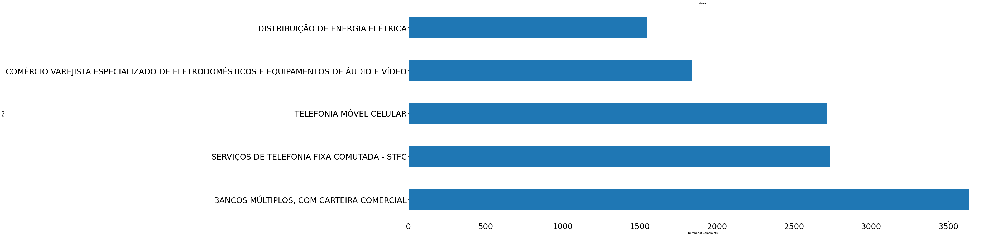

In [20]:
fig, ax = plt.subplots(figsize=(40,15))
plt.xticks(fontsize= 30)
plt.yticks(fontsize= 30)
data['area'].value_counts()[:5].plot(kind='barh')
plt.xlabel('Number of Complaints')
plt.ylabel('Area')
plt.title('Area')
plt.show()

In [21]:
#from textwrap import wrap
#data['area'].value_counts()[:5].plot(kind='barh')
#plt.xlabel('Number of Complaints')
#plt.ylabel('Area')
#plt.title('Companies Complaints')
#labels = ['DISTRIBUIÇÃO DE ENERGIA ELÉTRICA','COMÉRCIO VAREJISTA ESPECIALIZADO DE ELTRODOMÉSTICOS E EQUIPAMENTOS DE ÁUDIO E VÍDEO','TELEFONIA MÓVEL CELULAR','SERVIÇOS DE TEELFONIA FIXA COMUTADA - STFC','BANCOS MÚLTIPLOS, COM CARTEIRA COMERCIAL']
#labels = ['\n'.join(wrap(l,30)) for l in labels]
#plt.yticks([4,3,2,1,0], labels)
#plt.show()
#data['area'] = ['\n'.join(wrap(x, 12)) for x in  data['area'])

> <font color = '#125031' size = 5 face = "black body"> Problem </font>

At the end, the most complained problem is related with broken products, followed by improper billing and improper/abusive billing. Further, notice that we could, eventually, merge this two types of problem into one called improper billing. 

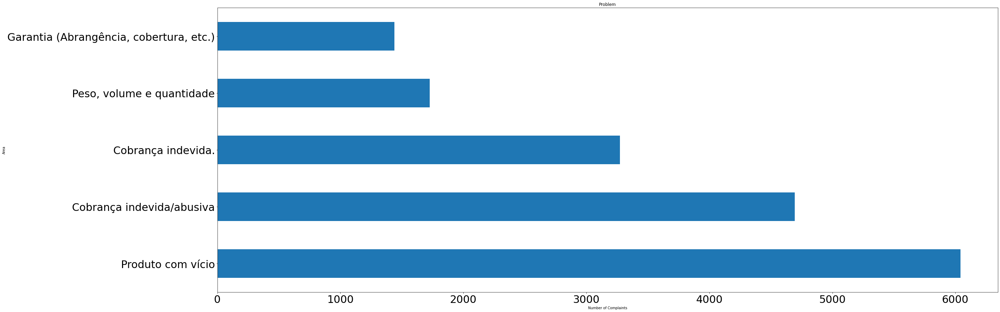

In [22]:
fig, ax = plt.subplots(figsize=(40,15))
plt.xticks(fontsize= 30)
plt.yticks(fontsize= 30)
data['problema'].value_counts()[:5].plot(kind='barh')
plt.xlabel('Number of Complaints')
plt.ylabel('Area')
plt.title('Problem')
#plt.text(18000, .025, 'The major of complaints in database is from Central-West Region')
plt.show()

So, we could do a NLP analysis to gain more knowledge about this database. 

## 3. NLP Analysis 

Using nltk and some packages of visualisation, we can have some insights about this database, instead of using traditional plots. Besides, using this kind of approach, there is much more areas we could explore, like using tokenization, stopwords lists. These processes are fundamental to apply ML techniques, so that is what we are gonna do!

#### 3.1 Worcloud - company

First, we are going to make a wordcloud, displaying the companies with the most complaints.

#### Companies column segregation

In [23]:
data_company = pd.DataFrame() # creating a dataframe
data_company['company'] = data['empresa'] # assign company column of data variable
data_company.tail() # checking last five rows
#data_company.index

,company
42302,B2W COMPANHIA DIGITAL
42303,ADIDAS DO BRASIL LTDA
42304,RN COMERCIO VAREJISTA S/A
42305,DECOLAR.COM LTDA
42306,ESAB ESCOLA SUPERIOR ABERTA DO BRASIL LTDA


#### Checking Null values

As we checked in the previous topics, there is a null cell in company's column. 

In [24]:
data_company.isnull().sum() # check for null values

company    1
dtype: int64

Then, we are going to drop this observation...


In [25]:
data_company.dropna(inplace = True) # dropping   --- inplace = True means change in data frame itself. False creates a copy of the object.
data_company.isnull().sum() # checking again...

company    0
dtype: int64

#### Creating String for wordcloud

We want to ensure some design patterns in wordcloud. Also, to guarantee it will work, this step is important and necessary. First, we could change some signs using dictionary. Dictionaries is an alternative to store and map data we want to apply in our code.

In [26]:
dictionary_signs = {' ':'_','/':'',',':'','\(':'','\)':'',"-":'','\.':'',r"^\t":''}
data_company['Company_name_without_space'] = data_company.replace({'company': dictionary_signs}, regex = True) # regex=True because it is string. 
data_company.head()

,company,Company_name_without_space
0,ITAÚ UNIBANCO S/A,ITAÚ_UNIBANCO_SA
1,CLARO S/A,CLARO_SA
2,ELETROPAULO METROPOLITANA ELETRICIDADE DE S PAULO,ELETROPAULO_METROPOLITANA_ELETRICIDADE_DE_S_PAULO
3,GNN GARAGENS LTDA - EPP,GNN_GARAGENS_LTDA__EPP
4,CLARO S/A,CLARO_SA


 Also, it's interesting to upper or lower all strings written in this column.

In [27]:
data_company['Company_name_without_space'] = data_company['Company_name_without_space'].str.lower()
data_company['Company_name_without_space'].head()

0                                     itaú_unibanco_sa
1                                             claro_sa
2    eletropaulo_metropolitana_eletricidade_de_s_paulo
3                               gnn_garagens_ltda__epp
4                                             claro_sa
Name: Company_name_without_space, dtype: object

Then, we could print (ascending order) the number of complaints by company. As we can see, it is the same kind of information that we provided before in our data analysis (Topic 2). The only difference is the kind of visualisation.

In [28]:
print(data_company.groupby('Company_name_without_space').size().sort_values(ascending=False))

Company_name_without_space
telefonica_brasil_sa                                  1150
claro_sa                                              1125
tim_celular_sa                                         786
via_varejo_sa                                          516
eletropaulo_metropolitana_eletricidade_de_s_paulo      480
                                                      ... 
mas_cobrança_e_reestruturaçao_de_ativos_financeiro       1
mas_informatica_ltda__contato_informática                1
mas_informatica_ltda__me                                 1
masima_incorporações_&_empreedimentos_ltda               1
123_viagem_de_turismo_ltda                               1
Length: 10607, dtype: int64


Now we finished the data preparation. We just have to gather all names collected from company_without_name column into one single string, called 'string_company'.

In [29]:
string_company = " ".join(text for text in data_company['Company_name_without_space']) # create an only string joining each variable in the company_without_name column, separated by a blank space.
#string_company

#### Generating wordcloud - company


The word cloud allowed to verify that Telefônica Brasil SA is the company with most complaints in Procon Data Base. Also, these results indicates that companies of telecommunication area have been suffering the most complaints.

-- Using colors of Brazil flag

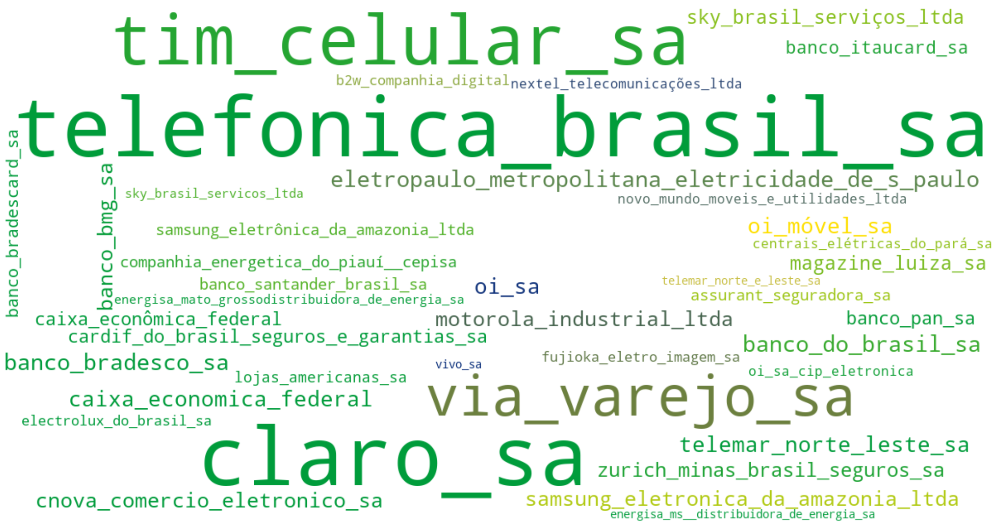

In [30]:
complaints_mask = np.array(Image.open("brasil.jpg"))
wordcloud = WordCloud(background_color="white",collocations=False,
                      max_words=40,max_font_size=200,width = 3000,height = 2000,
                      mask=complaints_mask,mode="RGBA").generate(string_company)


image_colors = ImageColorGenerator(complaints_mask)
plt.figure(figsize=[40,30])
plt.imshow(wordcloud.recolor(color_func=image_colors), interpolation="bilinear")
plt.axis("off")

##plt.figure(figsize = (40,30),
##           facecolor = 'k',
##           edgecolor = 'k')
# mostrar a imagem final
#fig, ax = plt.subplots(figsize=(10,10))
#ax.imshow(wordcloud, interpolation='bilinear')
#ax.set_axis_off()

#plt.imshow(wordcloud, interpolation='bilinear')
#plt.axis('off')
#plt.tight_layout(pad=0)
#wordcloud.to_file("xxxx.png")
plt.show()

-- Using reproved face mask and top-300 instead of top-40...

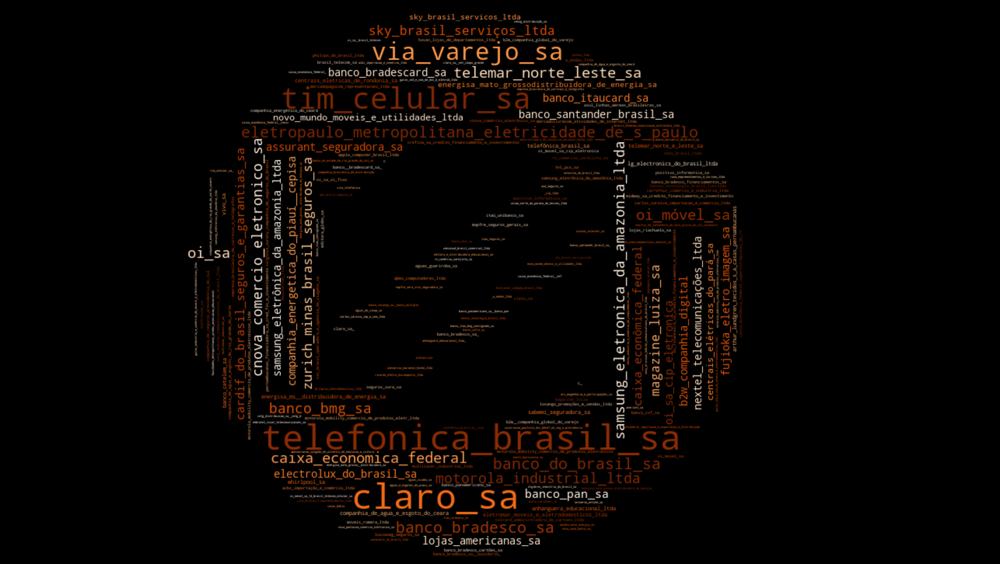

In [31]:
complaints_mask = np.array(Image.open("rep.jpg"))
wordcloud = WordCloud(background_color="black",colormap="Oranges_r",collocations=False,
                      max_words=300,max_font_size=200,width = 3000,height = 2000,
                      mask=complaints_mask).generate(string_company)

plt.figure(figsize = (40,30),
          facecolor = 'k',
          edgecolor = 'k')

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
#wordcloud.to_file("xxxx.png")
#plt.savefig("Empresa_wordcloud.png")
plt.show()

#### 3.2 Worcloud - State

Same steps of previous topic...

In [32]:
data_state = pd.DataFrame() # creating a dataframe
data_state['state'] = data['estado'] # assign state column of data variable
data_state.tail() # checking last five rows
#data_company.index

,state
42302,SP
42303,SP
42304,SP
42305,SP
42306,SP


In [33]:
data_state.isnull().sum() # check for null values

state    0
dtype: int64

In [34]:
print(data_state.groupby('state').size().sort_values(ascending=False))

state
SP    8127
GO    7764
MS    4723
RN    4073
MT    3972
MG    3460
PI    2153
RO    2057
SC    1955
CE    1766
ES     828
TO     567
PA     341
PB     302
MA     126
RS      90
PE       3
dtype: int64


In [35]:
string_state = " ".join(text for text in data_state['state']) # create an only string joining each variable in the state column, separated by a blank space.
#string_company

Analyzing the word cloud, it suggests São Paulo has the most complaints of companies.

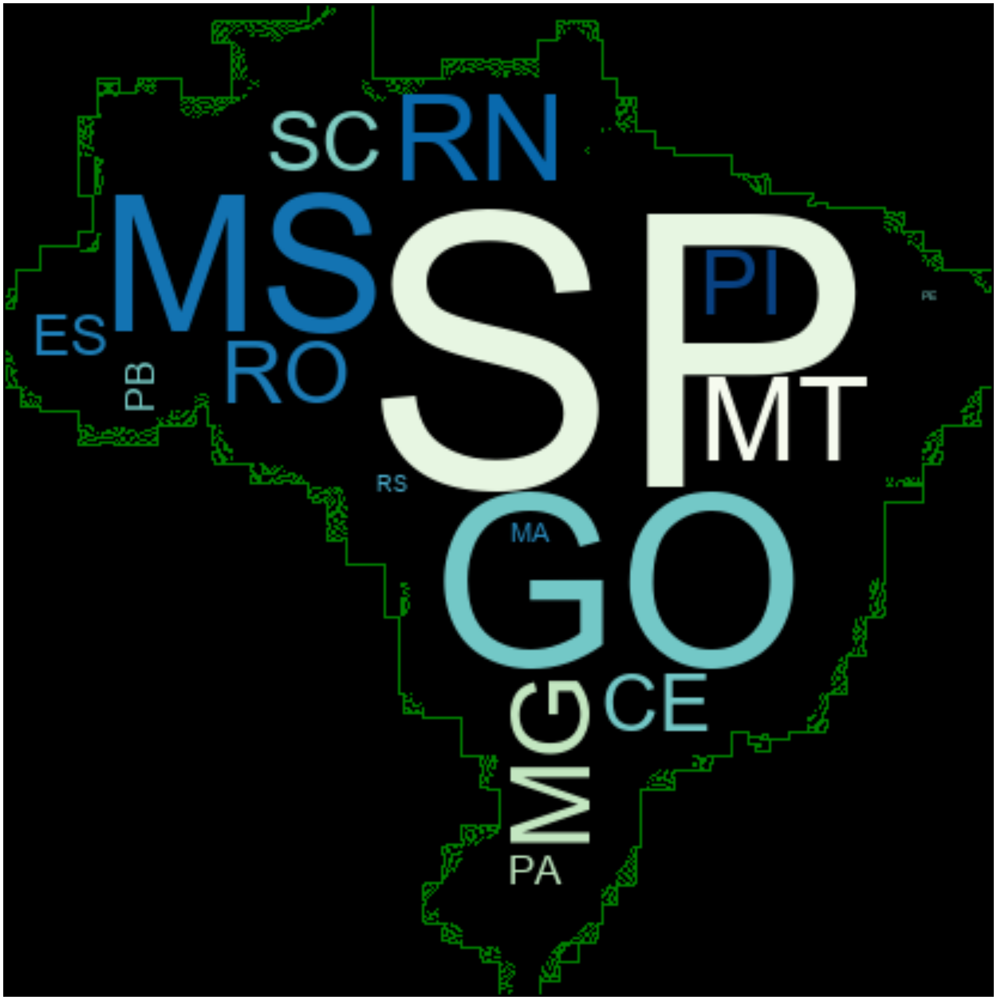

In [36]:
complaints_mask = np.array(Image.open("brasil_mapa.jpg"))
wordcloud = WordCloud(background_color="black",colormap="GnBu",collocations=False,
                      max_words=1000,max_font_size=200,width = 3000,height = 2000,
                      mask=complaints_mask, contour_width=.01, contour_color='green').generate(string_state) 

plt.figure(figsize = (40,30))

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
#wordcloud.to_file("xxxx.png")
#plt.savefig("Empresa_wordcloud.png")
#font_path='arial',
plt.show()

#### 3.3 Worcloud - Service

Same steps of topic 3.1...

In [37]:
data_service = pd.DataFrame() # creating a dataframe
data_service['service'] = data['serviço'] # assign service column of data variable
data_service.tail() # checking last five rows
#data_company.index

,service
42302,Microcomputador / Produtos de Informática
42303,Vestuário ( Calçado / Roupa )
42304,"Acessório Para Vestuário ( Bolsa, Cinto, Chapé..."
42305,Agências e Operadoras de viagens (pacotes turí...
42306,"Escola ( Pré, 1º, 2º Graus e Superior )"


In [38]:
data_service.isnull().sum() # check for null values

service    0
dtype: int64

In [39]:
dictionary_signs = {' ':'_','/':'',',':'','\(':'','\)':'',"-":'','\.':'',r"^\t":''}
data_service['service_without_space'] = data_service.replace({'service': dictionary_signs}, regex = True) # regex=True because it is string. 
data_service.head()

,service,service_without_space
0,Outros Contratos,Outros_Contratos
1,Telefonia Fixa ( Plano de Expansão / Compra e ...,Telefonia_Fixa__Plano_de_Expansão__Compra_e_Ve...
2,Energia Elétrica,Energia_Elétrica
3,"Estacionamento ( Particular, Supermercado, Sho...",Estacionamento__Particular_Supermercado_Shoppi...
4,Telefonia Fixa ( Plano de Expansão / Compra e ...,Telefonia_Fixa__Plano_de_Expansão__Compra_e_Ve...


In [40]:
data_service['service_without_space'] = data_service['service_without_space'].str.lower()
data_service['service_without_space'].head()

0                                     outros_contratos
1    telefonia_fixa__plano_de_expansão__compra_e_ve...
2                                     energia_elétrica
3    estacionamento__particular_supermercado_shoppi...
4    telefonia_fixa__plano_de_expansão__compra_e_ve...
Name: service_without_space, dtype: object

In [41]:
print(data_service.groupby('service_without_space').size().sort_values(ascending=False))

service_without_space
telefone__convencional_celular_interfone_etc_                  5149
telefonia_celular                                              3037
telefonia_fixa__plano_de_expansão__compra_e_venda__locação_    2713
banco_comercial                                                2313
cartão_de_crédito                                              2274
                                                               ... 
charutaria__cigarro_tabaco_cachimbo_etc_                          1
embalagem                                                         1
farináceos_fubá_polvilho_etc                                      1
profissional_liberal__veterinário                                 1
radiochamada__pager                                               1
Length: 193, dtype: int64


In [42]:
string_service = " ".join(text for text in data_service['service_without_space']) # create an only string joining each variable in the state column, separated by a blank space.
#string_company

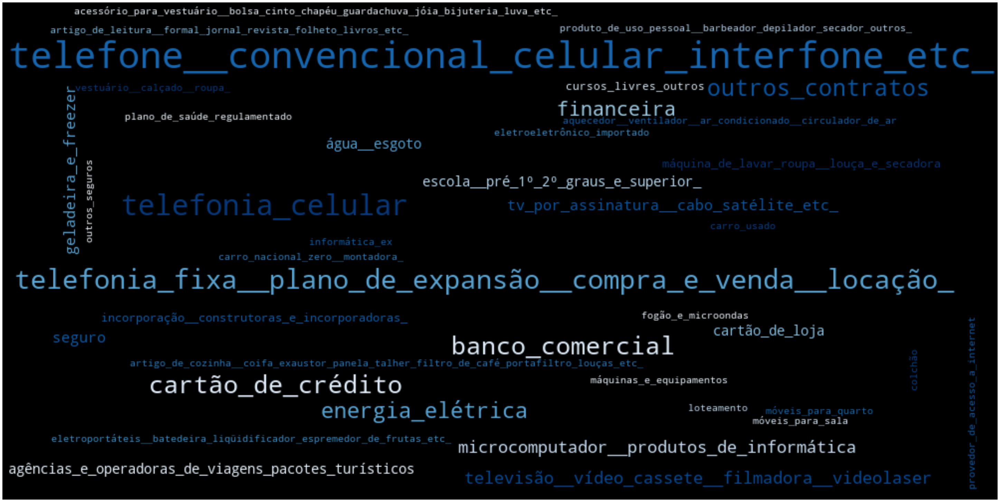

In [43]:
wordcloud = WordCloud(background_color="black",collocations=False,colormap="Blues_r",
                      max_words=40,max_font_size=200,width = 1000,height = 500).generate(string_service)

plt.figure(figsize = (40,30))

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
#wordcloud.to_file("xxxx.png")
#plt.savefig("Empresa_wordcloud.png")
plt.show()

#### 3.4 Worcloud - Area

In [44]:
data_area = pd.DataFrame() # creating a dataframe
data_area['area'] = data['area'] # assign service column of data variable
data_area.tail() # checking last five rows
#data_company.index

,area
42302,COMÉRCIO VAREJISTA DE OUTROS PRODUTOS NÃO ESPE...
42303,COMÉRCIO ATACADISTA DE CALÇADOS
42304,COMÉRCIO VAREJISTA ESPECIALIZADO DE ELETRODOMÉ...
42305,AGÊNCIAS DE VIAGENS
42306,EDUCAÇÃO SUPERIOR - GRADUAÇÃO E PÓS-GRADUAÇÃO


In [45]:
data_area.isnull().sum() # check for null values

area    5329
dtype: int64

In [46]:
data_area.dropna(inplace = True) # dropping   --- inplace = True means change in data frame itself. False creates a copy of the object.
data_area.isnull().sum() # checking again...

area    0
dtype: int64

In [47]:
dictionary_signs = {' ':'_','/':'',',':'','\(':'','\)':'',"-":'','\.':'',r"^\t":''}
data_area['area_without_space'] = data_area.replace({'area': dictionary_signs}, regex = True) # regex=True because it is string. 
data_area.head()

,area,area_without_space
0,"BANCOS MÚLTIPLOS, COM CARTEIRA COMERCIAL",BANCOS_MÚLTIPLOS_COM_CARTEIRA_COMERCIAL
2,DISTRIBUIÇÃO DE ENERGIA ELÉTRICA,DISTRIBUIÇÃO_DE_ENERGIA_ELÉTRICA
3,ESTACIONAMENTO DE VEÍCULOS,ESTACIONAMENTO_DE_VEÍCULOS
4,TELEFONIA MÓVEL CELULAR,TELEFONIA_MÓVEL_CELULAR
5,TRANSPORTE AÉREO DE PASSAGEIROS REGULAR,TRANSPORTE_AÉREO_DE_PASSAGEIROS_REGULAR


In [48]:
data_area['area_without_space'] = data_area['area_without_space'].str.lower()
data_area['area_without_space'].head()

0    bancos_múltiplos_com_carteira_comercial
2           distribuição_de_energia_elétrica
3                 estacionamento_de_veículos
4                    telefonia_móvel_celular
5    transporte_aéreo_de_passageiros_regular
Name: area_without_space, dtype: object

In [49]:
print(data_area.groupby('area_without_space').size().sort_values(ascending=False))

area_without_space
bancos_múltiplos_com_carteira_comercial                                                 3635
serviços_de_telefonia_fixa_comutada__stfc                                               2736
telefonia_móvel_celular                                                                 2711
comércio_varejista_especializado_de_eletrodomésticos_e_equipamentos_de_áudio_e_vídeo    1840
distribuição_de_energia_elétrica                                                        1544
                                                                                        ... 
comércio_atacadista_de_cimento                                                             1
fabricação_de_artefatos_diversos_de_madeira_exceto_móveis                                  1
fabricação_de_artefatos_de_tapeçaria                                                       1
fabricação_de_armas_de_fogo_e_munições                                                     1
produção_de_filmes_para_publicidade                

In [50]:
string_area = " ".join(text for text in data_area['area_without_space']) # create an only string joining each variable in the state column, separated by a blank space.
#string_company

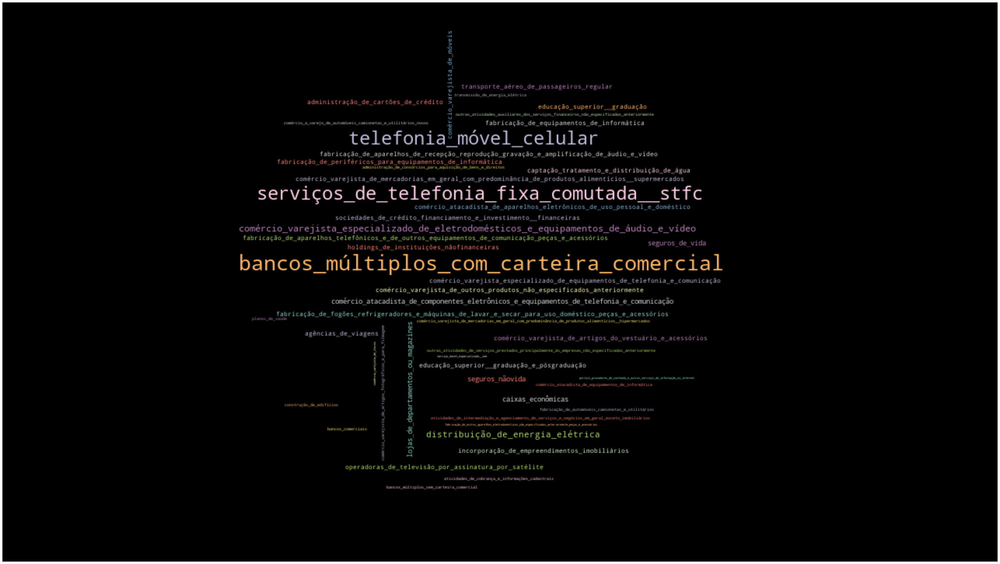

In [51]:
complaints_mask = np.array(Image.open("bola.jpg"))
wordcloud = WordCloud(background_color="black",collocations=False,colormap="Set3",
                      max_words=50,max_font_size=200,width = 3000,height = 2000,
                      mask=complaints_mask).generate(string_area)

plt.figure(figsize = (40,30))

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
#wordcloud.to_file("xxxx.png")
#plt.savefig("Empresa_wordcloud.png")
plt.show()

#### 3.5 Working with Problem column 

> Data Analysis ('problem' column), Data Cleaning, Tokenization, Stop-words, Stemming 

Now that we have understood a little bit more about this database, we are going to step up further, analysing Problem column. For this, we are gonna make some data cleaning and essential NLP pre-processing techniques.

In [52]:
data_problem = pd.DataFrame() # creating a dataframe
data_problem['problem'] = data['problema'] # assign service column of data variable
data_problem.tail() # checking last five rows
#data_company.index

,problem
42302,Não entrega/demora na entrega do produto
42303,Não entrega/demora na entrega do produto
42304,Produto entregue diferente do pedido
42305,Recusa injustificada em prestar serviço
42306,Serviço não fornecido (entrega/instalação/não ...


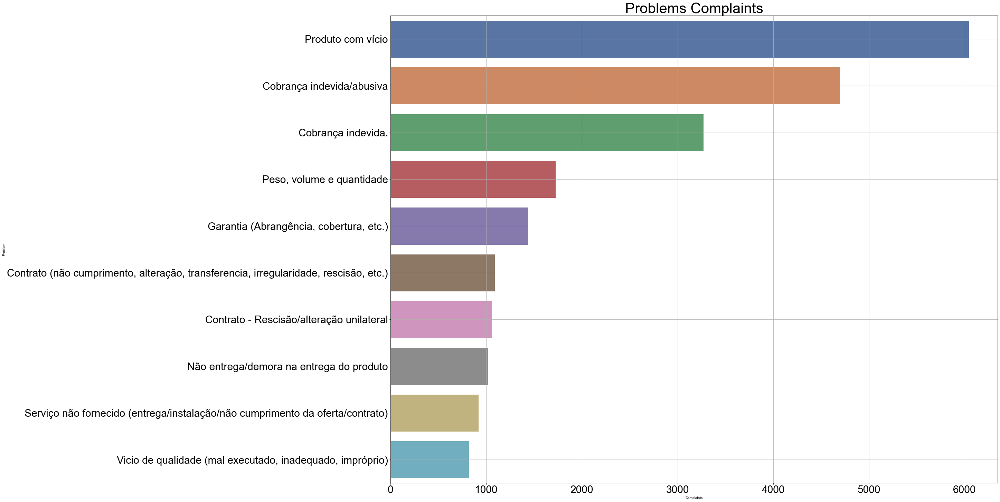

In [53]:
# Initializate matplotlib figure
f, ax = plt.subplots(figsize = (40,20))
plt.xticks(fontsize= 30)
plt.yticks(fontsize= 30)
# Initializate seaborn style
sns.set(style = "ticks",font_scale = 3.5)
#Load Dataset
sns.countplot(y = "problem", data = data_problem,
             order = data_problem["problem"].value_counts().index[:10])
ax.grid(True)
ax.set_title("Problems Complaints")
ax.set_ylabel("Problem")
ax.set_xlabel("Complaints")
plt.tight_layout(pad=0)
#plt.savefig("Barplot_problem.png")
plt.show()

#### Data cleaning


Straight away, we need to lower or upper all the letters, remove comma, dots, brackets...we must to remove these signs that means nothing to our analysis.

In [54]:
data_problem.head()

,problem
0,"Contrato (não cumprimento, alteração, transfer..."
1,Contrato - Rescisão/alteração unilateral
2,PID - Pedido de Indenização por Danos Morais
3,"Vicio de qualidade (mal executado, inadequado,..."
4,"Vicio de qualidade (mal executado, inadequado,..."


In [55]:
data_problem.shape

(42307, 1)

In [56]:
data_problem.iloc[:,0]

0        Contrato (não cumprimento, alteração, transfer...
1                 Contrato - Rescisão/alteração unilateral
2             PID - Pedido de Indenização por Danos Morais
3        Vicio de qualidade (mal executado, inadequado,...
4        Vicio de qualidade (mal executado, inadequado,...
                               ...                        
42302             Não entrega/demora na entrega do produto
42303             Não entrega/demora na entrega do produto
42304                 Produto entregue diferente do pedido
42305              Recusa injustificada em prestar serviço
42306    Serviço não fornecido (entrega/instalação/não ...
Name: problem, Length: 42307, dtype: object

First, we could remove all NULL values. The code below has showed 8936 Null values.

In [57]:
data_problem.isnull().sum()

problem    8936
dtype: int64

Removing...

In [58]:
data_problem.dropna(inplace = True) #dropping

Now we have 33371 rows of "problems".

In [59]:
data_problem.shape

(33371, 1)

In [60]:
# That regular expression removes all alphanumeric words and turn all words into lower.

lower_number = lambda x: re.sub(r"""\w*\d\w*""", ' ', x.lower())
data_problem['problem'] = data_problem.problem.map(lower_number)

data_problem.head()

,problem
0,"contrato (não cumprimento, alteração, transfer..."
1,contrato - rescisão/alteração unilateral
2,pid - pedido de indenização por danos morais
3,"vicio de qualidade (mal executado, inadequado,..."
4,"vicio de qualidade (mal executado, inadequado,..."


In [61]:
# That regular expression removes all punctuation.

punc_re = lambda x: re.sub('[%s]' % re.escape(string.punctuation), ' ', x)
data_problem['problem'] = data_problem.problem.map(punc_re)

data_problem.head()

,problem
0,contrato não cumprimento alteração transfer...
1,contrato rescisão alteração unilateral
2,pid pedido de indenização por danos morais
3,vicio de qualidade mal executado inadequado ...
4,vicio de qualidade mal executado inadequado ...


#### Checking characters frequency

Now we drop the Null values and before we continue with the pre-processing, let's do an investigate about characters frequency.

######  (Just for training)

In [62]:
data_problem.problem.map(len).value_counts().head() # Characters frequency

25    6421
17    6051
18    3579
40    2107
39    1895
Name: problem, dtype: int64

In [63]:
len(data_problem.problem[1]) # Just checking...

40

In [64]:
data_problem.problem.map(len) # Just checking...

0        84
1        40
2        44
3        57
4        57
         ..
42302    40
42303    40
42304    36
42305    39
42306    77
Name: problem, Length: 33371, dtype: int64

In [65]:
len(data_problem.problem) # Just checking...

33371

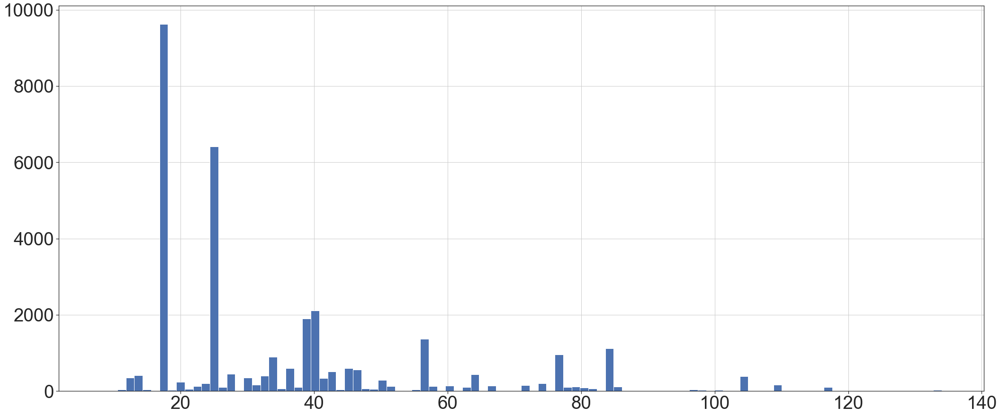

In [66]:
f, ax = plt.subplots(figsize = (35,15)) #Plotting...
#plt.xticks(fontsize= 30)
#plt.yticks(fontsize= 30)
data_problem.problem.map(len).hist(bins=100)
plt.show()

#### Tokenization


Tokenization is a key process to deal with text data. In a nut shell, it's separate text into pieces (called tokens) in one vector.

In [67]:
data_problem['tokens'] = data_problem.problem.map(word_tokenize) # mapping word_tokenize
data_problem.head()

,problem,tokens
0,contrato não cumprimento alteração transfer...,"[contrato, não, cumprimento, alteração, transf..."
1,contrato rescisão alteração unilateral,"[contrato, rescisão, alteração, unilateral]"
2,pid pedido de indenização por danos morais,"[pid, pedido, de, indenização, por, danos, mor..."
3,vicio de qualidade mal executado inadequado ...,"[vicio, de, qualidade, mal, executado, inadequ..."
4,vicio de qualidade mal executado inadequado ...,"[vicio, de, qualidade, mal, executado, inadequ..."


In [68]:
# One list with all tokens
word_list = sum(data_problem.tokens.tolist(), [])

word_list[:20] # cheking first 20 rows

['contrato',
 'não',
 'cumprimento',
 'alteração',
 'transferencia',
 'irregularidade',
 'rescisão',
 'etc',
 'contrato',
 'rescisão',
 'alteração',
 'unilateral',
 'pid',
 'pedido',
 'de',
 'indenização',
 'por',
 'danos',
 'morais',
 'vicio']

Creating list with stop words using nltk stop words...

In [69]:
stop_words = nltk.corpus.stopwords.words('portuguese') 

stop_words[:20]

['de',
 'a',
 'o',
 'que',
 'e',
 'é',
 'do',
 'da',
 'em',
 'um',
 'para',
 'com',
 'não',
 'uma',
 'os',
 'no',
 'se',
 'na',
 'por',
 'mais']

In [70]:
#filter list with list_comprehension

[i for i in stop_words if i == 'etc']


[]

In [71]:
len(stop_words)

204

In [72]:
update = ["etc","pid"] # updating two words...

In [73]:
update

['etc', 'pid']

In [74]:
stop_words.extend(update) # inserting update...

In [75]:
len(stop_words)

206

Creating new column named 'tokens_stop' without stop words. It's interesting to maintain all modifications into the same variable to follow the transformations...

In [76]:
stop_lambda = lambda x: [y for y in x if y not in stop_words]
data_problem['tokens_stop'] = data_problem.tokens.apply(stop_lambda)
data_problem.head()

,problem,tokens,tokens_stop
0,contrato não cumprimento alteração transfer...,"[contrato, não, cumprimento, alteração, transf...","[contrato, cumprimento, alteração, transferenc..."
1,contrato rescisão alteração unilateral,"[contrato, rescisão, alteração, unilateral]","[contrato, rescisão, alteração, unilateral]"
2,pid pedido de indenização por danos morais,"[pid, pedido, de, indenização, por, danos, mor...","[pedido, indenização, danos, morais]"
3,vicio de qualidade mal executado inadequado ...,"[vicio, de, qualidade, mal, executado, inadequ...","[vicio, qualidade, mal, executado, inadequado,..."
4,vicio de qualidade mal executado inadequado ...,"[vicio, de, qualidade, mal, executado, inadequ...","[vicio, qualidade, mal, executado, inadequado,..."


In [104]:
# Finding most common words...

# That creates one single list with all tokens
word_list_single = sum(data_problem.tokens_stop.tolist(), [])

word_list_single[:10]

['contrato',
 'cumprimento',
 'alteração',
 'transferencia',
 'irregularidade',
 'rescisão',
 'contrato',
 'rescisão',
 'alteração',
 'unilateral']

In [105]:
# Convert the list into a dictionary with value counting. 
word_counts_single = Counter(word_list_single)
count = word_counts_single

# Invert values and keys...
word_counts_single = list(zip(word_counts_single.values(), word_counts_single.keys()))

# Sort list by counting....
word_counts_single = sorted(word_counts_single, reverse=True)

# Print the 10 most common words
word_counts_single[:10]

[(10009, 'cobrança'),
 (8720, 'indevida'),
 (7759, 'produto'),
 (6103, 'vício'),
 (4902, 'abusiva'),
 (4571, 'contrato'),
 (3347, 'entrega'),
 (2721, 'rescisão'),
 (2532, 'serviço'),
 (2267, 'cumprimento')]

Creating Word Cloud...

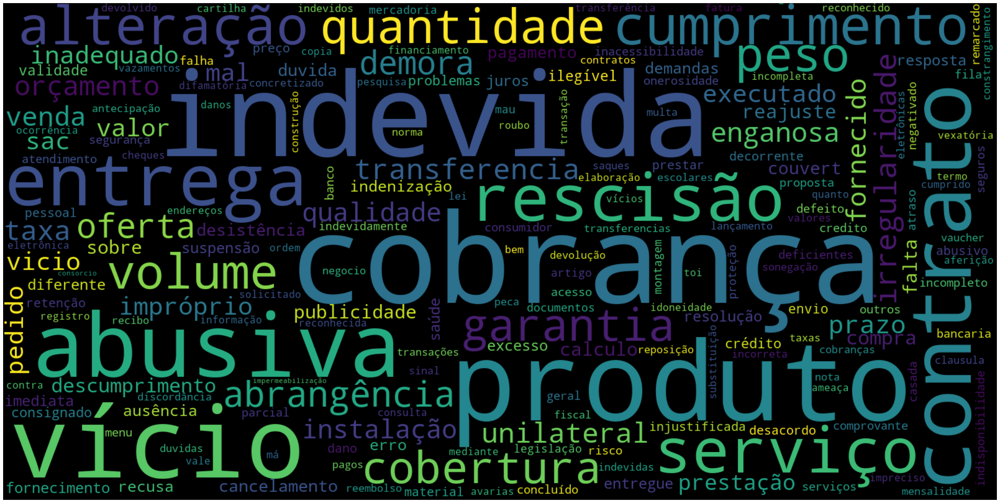

In [79]:
#text = word_list_clean
wordcloud = WordCloud(width=1600, height=800, max_font_size=200,max_words = 200).fit_words(count)
#wordcloud = WordCloud(width=1600, height=800, max_font_size=200).generate(text)
plt.figure(figsize=(40,30))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

#### Stemming

Now, we could try do a stemming. In a nutshell, Stemming is a process to obtain the "roots" of the word. Also, it's important to say that a steming process doesn't consider the meaning of words, instead of lemmatization, which considers the lema of the words. So: \
\
Caring ---- Lemmatization --- 'care' \
Caring ---- Stemming --- 'car' \
\


In [80]:
# Stemming

stemmer = SnowballStemmer('portuguese')
stem_lambda = lambda x: [stemmer.stem(y) for y in x]

data_problem['tokens_stem'] = data_problem.tokens_stop.apply(stem_lambda)
data_problem.head()

,problem,tokens,tokens_stop,tokens_stem
0,contrato não cumprimento alteração transfer...,"[contrato, não, cumprimento, alteração, transf...","[contrato, cumprimento, alteração, transferenc...","[contrat, cumpriment, alter, transferenc, irre..."
1,contrato rescisão alteração unilateral,"[contrato, rescisão, alteração, unilateral]","[contrato, rescisão, alteração, unilateral]","[contrat, rescisã, alter, unilateral]"
2,pid pedido de indenização por danos morais,"[pid, pedido, de, indenização, por, danos, mor...","[pedido, indenização, danos, morais]","[ped, indeniz, dan, mor]"
3,vicio de qualidade mal executado inadequado ...,"[vicio, de, qualidade, mal, executado, inadequ...","[vicio, qualidade, mal, executado, inadequado,...","[vici, qualidad, mal, execut, inadequ, imprópri]"
4,vicio de qualidade mal executado inadequado ...,"[vicio, de, qualidade, mal, executado, inadequ...","[vicio, qualidade, mal, executado, inadequado,...","[vici, qualidad, mal, execut, inadequ, imprópri]"


In [81]:
# Finding most common words...

# That creates one single list with all tokens
word_list_stem = sum(data_problem.tokens_stem.tolist(), [])

word_list_stem[:10]

['contrat',
 'cumpriment',
 'alter',
 'transferenc',
 'irregular',
 'rescisã',
 'contrat',
 'rescisã',
 'alter',
 'unilateral']

The results show there is low gain in information to this column. This is caused by the patterns when displaying the problems, which is much different when we are dealing with personal opinion, for example. 

In [82]:
# Convert the list into a dictionary with value counting. 
word_counts_stem = Counter(word_list_stem)
count = word_counts_stem

# Invert values and keys...
word_counts_stem = list(zip(word_counts_stem.values(), word_counts_stem.keys()))

# Sort list by counting...
word_counts_stem = sorted(word_counts_stem, reverse=True)

# Print the 10 most common words
word_counts_stem[:10]

[(10106, 'cobranc'),
 (8952, 'indev'),
 (7759, 'produt'),
 (6150, 'víci'),
 (5140, 'abus'),
 (4681, 'contrat'),
 (3707, 'entreg'),
 (2722, 'servic'),
 (2721, 'rescisã'),
 (2267, 'cumpriment')]

In [83]:
#data.problema[] 
data_problem[data_problem['problem'].str.contains(r'servi(?!$)')] # just checking all rows with term 'servi' on column problem.


,problem,tokens,tokens_stop,tokens_stem
5,desistência do serviço artigo descumprime...,"[desistência, do, serviço, artigo, descumprime...","[desistência, serviço, artigo, descumprimento]","[desistent, servic, artig, descumpr]"
7,serviço não fornecido entrega instalação não ...,"[serviço, não, fornecido, entrega, instalação,...","[serviço, fornecido, entrega, instalação, cump...","[servic, fornec, entreg, instal, cumpriment, o..."
48,serviço não fornecido entrega instalação não ...,"[serviço, não, fornecido, entrega, instalação,...","[serviço, fornecido, entrega, instalação, cump...","[servic, fornec, entreg, instal, cumpriment, o..."
49,serviço não fornecido entrega instalação não ...,"[serviço, não, fornecido, entrega, instalação,...","[serviço, fornecido, entrega, instalação, cump...","[servic, fornec, entreg, instal, cumpriment, o..."
103,dano material pessoal decorrente do serviço,"[dano, material, pessoal, decorrente, do, serv...","[dano, material, pessoal, decorrente, serviço]","[dan, material, pessoal, decorrent, servic]"
...,...,...,...,...
42262,recusa injustificada em prestar serviço,"[recusa, injustificada, em, prestar, serviço]","[recusa, injustificada, prestar, serviço]","[recus, injustific, prest, servic]"
42263,recusa injustificada em prestar serviço,"[recusa, injustificada, em, prestar, serviço]","[recusa, injustificada, prestar, serviço]","[recus, injustific, prest, servic]"
42285,recusa injustificada em prestar serviço,"[recusa, injustificada, em, prestar, serviço]","[recusa, injustificada, prestar, serviço]","[recus, injustific, prest, servic]"
42305,recusa injustificada em prestar serviço,"[recusa, injustificada, em, prestar, serviço]","[recusa, injustificada, prestar, serviço]","[recus, injustific, prest, servic]"


### Representation

Now we made all planned pre-processing transformations, it's time to represent this data text. In this analysis, we will see two times of representation by frequency: Bag of Words and TF-IDF.

> Bag Of Words Frequency Representation

We're going to make a matrix, displaying all problemns description on rows and each columnn represents each word. The goal in Bag Of Words is represent each row into a vector.

In [85]:
matrix = CountVectorizer()
X = matrix.fit_transform(data_problem.problem).toarray()
X.shape
dt = pd.DataFrame(X, columns=matrix.get_feature_names()).set_index(data_problem.problem)
#dt = pd.DataFrame(X)
dt.head()

,abrangência,abusiva,abusivo,acesso,acidente,acima,acompanhamento,adquirido,advocaticios,aferição,...,vexatória,via,vicio,violenta,volume,votação,voucher,vício,vícios,órgão
problem,,,,,,,,,,,,,,,,,,,,,
contrato não cumprimento alteração transferencia irregularidade rescisão etc,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
contrato rescisão alteração unilateral,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
pid pedido de indenização por danos morais,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
vicio de qualidade mal executado inadequado impróprio,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
vicio de qualidade mal executado inadequado impróprio,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


> TF-IDF Frequency Representation

In TF-IDF representation, there is weight for frequency. So the IDF (inverse document frequency) is high to rare words and low to frequent words.

In [87]:
cv_tfidf = TfidfVectorizer() # we're going to maintain default parameters... min_df, max_df, ngram_range=(), sublinear_tf=True
X_tfidf = cv_tfidf.fit_transform(data_problem.problem).toarray()

dt_tfidf = pd.DataFrame(X_tfidf, columns=cv_tfidf.get_feature_names()).set_index(data_problem.problem)
dt_tfidf.head()

,abrangência,abusiva,abusivo,acesso,acidente,acima,acompanhamento,adquirido,advocaticios,aferição,...,vexatória,via,vicio,violenta,volume,votação,voucher,vício,vícios,órgão
problem,,,,,,,,,,,,,,,,,,,,,
contrato não cumprimento alteração transferencia irregularidade rescisão etc,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
contrato rescisão alteração unilateral,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
pid pedido de indenização por danos morais,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
vicio de qualidade mal executado inadequado impróprio,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.398278,0.0,0.0,0.0,0.0,0.0,0.0,0.0
vicio de qualidade mal executado inadequado impróprio,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.398278,0.0,0.0,0.0,0.0,0.0,0.0,0.0


We can change parameters and obtain another wordcloud...let's try change the default n-gram (1,1) to (2,2).

In [109]:
cv_tfidf = TfidfVectorizer(ngram_range=(2,2)) # we're going to maintain default parameters... min_df, max_df, ngram_range=(), sublinear_tf=True
X_tfidf = cv_tfidf.fit_transform(data_problem.problem).toarray()

dt_tfidf = pd.DataFrame(X_tfidf, columns=cv_tfidf.get_feature_names()).set_index(data_problem.problem)
dt_tfidf.head()

,abrangência cobertura,abrangência reembolso,abusiva em,abusiva mediante,abusivo preço,abusivo remarcado,acesso ao,acidente de,acima do,acompanhamento de,...,vexatória difamatória,via etc,vicio de,violenta difamatória,volume quantidade,votação destituição,voucher etc,vício do,vícios vazamentos,órgão competente
problem,,,,,,,,,,,,,,,,,,,,,
contrato não cumprimento alteração transferencia irregularidade rescisão etc,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
contrato rescisão alteração unilateral,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
pid pedido de indenização por danos morais,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
vicio de qualidade mal executado inadequado impróprio,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.408248,0.0,0.0,0.0,0.0,0.0,0.0,0.0
vicio de qualidade mal executado inadequado impróprio,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.408248,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Doing another word cloud....

In [110]:
feature_names = cv_tfidf.get_feature_names()

In [111]:
# Convert the list into a dictionary with value counting.
word_counts_clean = Counter(feature_names)
count = word_counts_clean

# Invert values and keys...
word_counts_clean = list(zip(word_counts_clean.values(), word_counts_clean.keys()))

# Sort list by counting...
word_counts_clean = sorted(word_counts_clean, reverse=True)

# Print the 10 most common words
word_counts_clean.sort()
word_counts_clean[:10]

[(1, 'abrangência cobertura'),
 (1, 'abrangência reembolso'),
 (1, 'abusiva em'),
 (1, 'abusiva mediante'),
 (1, 'abusivo preço'),
 (1, 'abusivo remarcado'),
 (1, 'acesso ao'),
 (1, 'acidente de'),
 (1, 'acima do'),
 (1, 'acompanhamento de')]

The result it's not so good. 

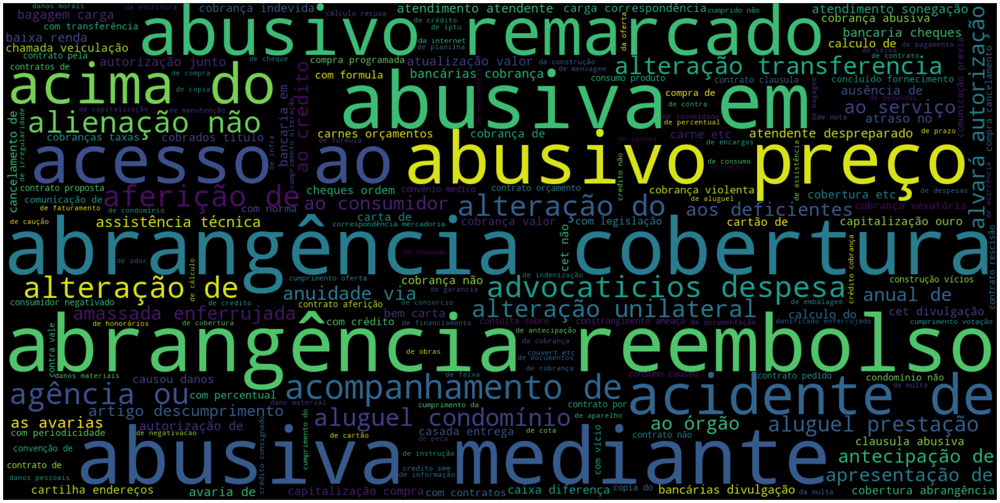

In [112]:
#text = testes # word_list_clean
wordcloud = WordCloud(width=1600, height=800, max_font_size=200,max_words = 200).fit_words(count)
#wordcloud = WordCloud(width=1600, height=800, max_font_size=200).generate(text)
plt.figure(figsize=(40,30))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

There are many words that means nothing for us...let's remove the stop words again. 
\
obs: we could use the column 'tokens_stop' we did previously...but let's repeat the process (just for training).

In [117]:
data_tf_idf_problem = pd.DataFrame() # creating a dataframe
data_tf_idf_problem['problem'] = data_problem.tokens_stop # assign service column of data variable
data_tf_idf_problem.tail() # checking last five rows
#data_company.index


,problem
42302,"[entrega, demora, entrega, produto]"
42303,"[entrega, demora, entrega, produto]"
42304,"[produto, entregue, diferente, pedido]"
42305,"[recusa, injustificada, prestar, serviço]"
42306,"[serviço, fornecido, entrega, instalação, cump..."


Removing stop words...

In [118]:
stop_lambda = lambda x: [y for y in x if y not in stop_words]
data_tf_idf_problem['tokens_stop'] = data_tf_idf_problem.problem.apply(stop_lambda)
data_tf_idf_problem.head()

,problem,tokens_stop
0,"[contrato, cumprimento, alteração, transferenc...","[contrato, cumprimento, alteração, transferenc..."
1,"[contrato, rescisão, alteração, unilateral]","[contrato, rescisão, alteração, unilateral]"
2,"[pedido, indenização, danos, morais]","[pedido, indenização, danos, morais]"
3,"[vicio, qualidade, mal, executado, inadequado,...","[vicio, qualidade, mal, executado, inadequado,..."
4,"[vicio, qualidade, mal, executado, inadequado,...","[vicio, qualidade, mal, executado, inadequado,..."


Now we are going to "detokenize". It's a possible solution to apply new parameters of n-gram. 

In [119]:
TreebankWordDetokenizer().detokenize(data_problem.tokens_stop[1]) # just testing and checking...

'contrato rescisão alteração unilateral'

Detokenize...

In [120]:
#stop_lambda = lambda x: [y for y in x if y not in stop_words]
data_tf_idf_problem['tokens_stop'] = data_problem.tokens_stop.apply(TreebankWordDetokenizer().detokenize)
data_tf_idf_problem.head()

,problem,tokens_stop
0,"[contrato, cumprimento, alteração, transferenc...",contrato cumprimento alteração transferencia i...
1,"[contrato, rescisão, alteração, unilateral]",contrato rescisão alteração unilateral
2,"[pedido, indenização, danos, morais]",pedido indenização danos morais
3,"[vicio, qualidade, mal, executado, inadequado,...",vicio qualidade mal executado inadequado impró...
4,"[vicio, qualidade, mal, executado, inadequado,...",vicio qualidade mal executado inadequado impró...


In [121]:
data_tf_idf_problem.tokens_stop #checking...

0        contrato cumprimento alteração transferencia i...
1                   contrato rescisão alteração unilateral
2                          pedido indenização danos morais
3        vicio qualidade mal executado inadequado impró...
4        vicio qualidade mal executado inadequado impró...
                               ...                        
42302                       entrega demora entrega produto
42303                       entrega demora entrega produto
42304                    produto entregue diferente pedido
42305                 recusa injustificada prestar serviço
42306    serviço fornecido entrega instalação cumprimen...
Name: tokens_stop, Length: 33371, dtype: object

Let's goint to do all over again...

In [122]:
cv_tfidf = TfidfVectorizer(ngram_range=(2,2)) # we're going to maintain default parameters... min_df, max_df, ngram_range=(), sublinear_tf=True
X_tfidf = cv_tfidf.fit_transform(data_tf_idf_problem.tokens_stop).toarray()

dt_tfidf = pd.DataFrame(X_tfidf, columns=cv_tfidf.get_feature_names()).set_index(data_tf_idf_problem.tokens_stop)
dt_tfidf.head()

,abrangência cobertura,abrangência reembolso,abusiva desacordo,abusiva mediante,abusivo preço,abusivo remarcado,acesso serviço,acidente consumo,acima permitido,acompanhamento demandas,...,venda enganosa,venda oferta,vexatória difamatória,vicio qualidade,violenta difamatória,volume quantidade,votação destituição,vício produto,vícios vazamentos,órgão competente
tokens_stop,,,,,,,,,,,,,,,,,,,,,
contrato cumprimento alteração transferencia irregularidade rescisão,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
contrato rescisão alteração unilateral,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
pedido indenização danos morais,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
vicio qualidade mal executado inadequado impróprio,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.447214,0.0,0.0,0.0,0.0,0.0,0.0
vicio qualidade mal executado inadequado impróprio,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.447214,0.0,0.0,0.0,0.0,0.0,0.0


In [123]:
feature_names_stop = cv_tfidf.get_feature_names()

In [124]:
# Convert the list into a dictionary with value counting.
word_counts_clean = Counter(feature_names_stop)
count = word_counts_clean

# Invert values and keys...
word_counts_clean = list(zip(word_counts_clean.values(), word_counts_clean.keys()))

# Sort list by counting...
word_counts_clean = sorted(word_counts_clean, reverse=True)

# Print the 10 most common words
word_counts_clean.sort()
word_counts_clean[:10]

[(1, 'abrangência cobertura'),
 (1, 'abrangência reembolso'),
 (1, 'abusiva desacordo'),
 (1, 'abusiva mediante'),
 (1, 'abusivo preço'),
 (1, 'abusivo remarcado'),
 (1, 'acesso serviço'),
 (1, 'acidente consumo'),
 (1, 'acima permitido'),
 (1, 'acompanhamento demandas')]

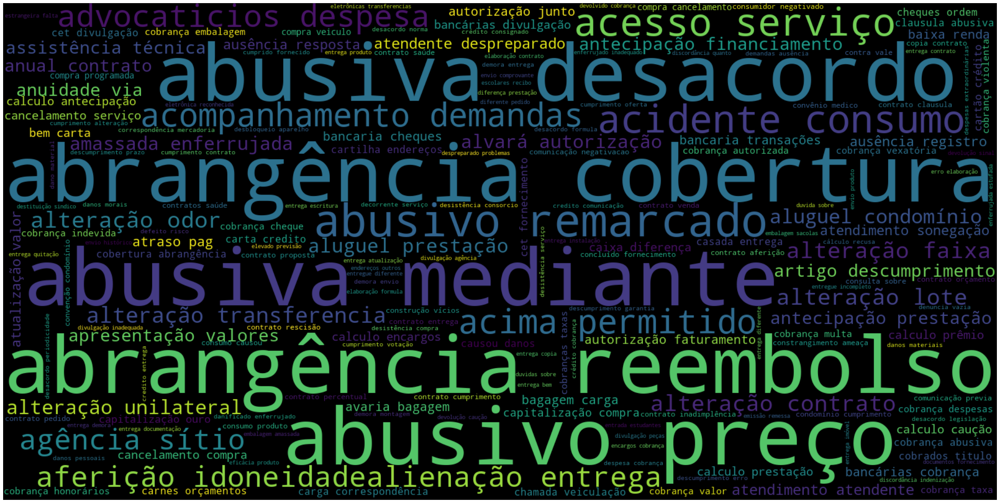

In [125]:
#text = testes # word_list_clean
wordcloud = WordCloud(width=1600, height=800, max_font_size=200,max_words = 200).fit_words(count)
#wordcloud = WordCloud(width=1600, height=800, max_font_size=200).generate(text)
plt.figure(figsize=(40,30))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

So, we've finished these first steps of pre-processing and representing by frequency. In future work, we could try start another kind of representation, much more accurate (frequency by context with word2vector, for example).

Still, this NLP analysis it's important to go further and starts a data mining analysis.